In [1]:
# !pip install torch torchvision --quiet
# !pip install optuna --quiet

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
import os
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random

from skimage import io, transform
from skimage.color import rgb2gray
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder,StandardScaler
# import optuna

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image


import random
from PIL import Image
import cv2

In [4]:
%cd /home/spyros/Desktop/DNN
# base_path = '/DNN'
metadata_path = os.path.join('HAM10000_metadata.csv')
metadata = pd.read_csv(metadata_path)

/home/spyros/Desktop/DNN


In [6]:
metadata.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [7]:
metadata.shape

(10015, 7)

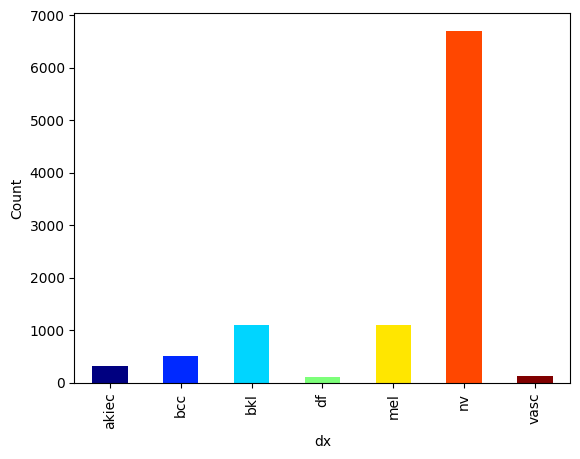

In [8]:

count = metadata.dx.value_counts().sort_index()

unique_vals = count.index
colors = plt.cm.jet(np.linspace(0, 1, len(unique_vals)))

count.plot(kind='bar', color=colors)

# plt.xlabel(f'{column} values')
plt.ylabel('Count')
# plt.title(f'Distribution of {column} column')
plt.show()

Strategy:
- clean the data, find the duplicates, do not alter them to labeled data.
- do data augmentation and equilization
- separete the data to train/val/test
- normalize them and convert to tensors
- make a different function to make the equilization of the pixels
- use 2-3 pretrained models with 2-3 different metrics and compare them
- create your own model and compare it with the pretrainned

# Clean the metadata

**Missing data:**
- fill the missing data valeues with the mean of their category, since the category is a float number.

**Float -> Integer**

**Remove the dyplicates if there are any**

The data are generally objects and integers, the only integer is the "age" and the rest are objects. In the next step the objects will be labeled.

In [9]:
def check_for_missing_data(df):
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values
    return summary

In [10]:
check_for_missing_data(metadata)

,Name,dtypes,Missing
0,lesion_id,object,0
1,image_id,object,0
2,dx,object,0
3,dx_type,object,0
4,age,float64,57
5,sex,object,0
6,localization,object,0


In [11]:
metadata['age'].fillna((metadata['age'].mean()), inplace=True)

In [12]:
def convert_float_to_int(df, column_name):
    if df[column_name].dtype == 'float64':
        df[column_name] = df[column_name].astype(int)
    return df

In [13]:
metadata = convert_float_to_int(metadata,'age')
metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   lesion_id     10015 non-null  object
 1   image_id      10015 non-null  object
 2   dx            10015 non-null  object
 3   dx_type       10015 non-null  object
 4   age           10015 non-null  int64 
 5   sex           10015 non-null  object
 6   localization  10015 non-null  object
dtypes: int64(1), object(6)
memory usage: 547.8+ KB


In [14]:
def check_for_duplicate_rows(df):
    size = df.shape
    sum_duplicates = df.duplicated().sum()
    sum_null = df.isnull().sum()
    return print("Number of Samples:" ,size[0],"\nDuplicated Entries: " ,sum_duplicates,"\nNull Entries:","\n",sum_null)

In [15]:
check_for_duplicate_rows(metadata)

Number of Samples: 10015 
Duplicated Entries:  0 
Null Entries: 
 lesion_id       0
image_id        0
dx              0
dx_type         0
age             0
sex             0
localization    0
dtype: int64


In [16]:
lesion_id_cnt = metadata['lesion_id'].value_counts()
def check_duplicates_lesions(id):
    if lesion_id_cnt[id] > 1:
        return True
    else:
        return False

metadata['dup_les'] = metadata['lesion_id'].map(check_duplicates_lesions)

In [17]:
metadata['dup_les'].value_counts()

dup_les
False    5514
True     4501
Name: count, dtype: int64

In [18]:
metadata = metadata[metadata.dup_les == False]
metadata.shape

(5514, 8)

# Load the images paths

Create 2 paths from drive. The images are separeted in these paths, so if they do not exist in path 1 they probably exist in path 2. Scanning all the rows using the "dx" and the "image_id" columns we can add the image path in a separete column in the dataframe.

In [19]:
base1_path = os.path.join('HAM10000_images_part_1')
base2_path = os.path.join('HAM10000_images_part_2')

image_paths = []

for index, row in metadata.iterrows():
  image_id = row['image_id']
  class_name = row['dx']

  part1_path = os.path.join(base1_path, class_name)
  part2_path = os.path.join(base2_path, class_name)

  image_path_1 = os.path.join(part1_path, f'{image_id}.jpg')
  image_path_2 = os.path.join(part2_path, f'{image_id}.jpg')

  if os.path.exists(image_path_1):
    image_paths.append(image_path_1)
  elif os.path.exists(image_path_2):
    image_paths.append(image_path_2)
  else: print(f'None of the paths {image_path_1} and {image_path_2} exists in google drive.')

metadata['image_path'] = image_paths

In [20]:
metadata.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dup_les,image_path
10,HAM_0001396,ISIC_0025276,bkl,histo,55,female,trunk,False,HAM10000_images_part_1/bkl/ISIC_0025276.jpg
15,HAM_0007207,ISIC_0031326,bkl,histo,65,male,back,False,HAM10000_images_part_2/bkl/ISIC_0031326.jpg
20,HAM_0006071,ISIC_0032343,bkl,histo,70,female,face,False,HAM10000_images_part_2/bkl/ISIC_0032343.jpg
33,HAM_0005612,ISIC_0024981,bkl,histo,80,male,scalp,False,HAM10000_images_part_1/bkl/ISIC_0024981.jpg
34,HAM_0005388,ISIC_0027815,bkl,histo,80,male,chest,False,HAM10000_images_part_1/bkl/ISIC_0027815.jpg


In [21]:
metadata.shape

(5514, 9)

# Exploration

<Axes: ylabel='count'>

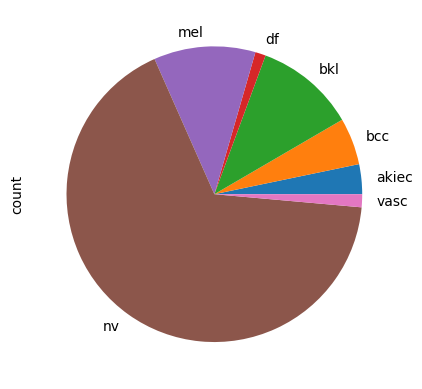

In [22]:
count.plot(kind='pie')

We can observe that there are some unknown values in the categories. Since they are not a separete category i chose to assign them in to different categorires with respect to the probability of each category to express. The number of values that are "unknown" are so little that even the wrong classification of them will only count as noise in the final model selection.

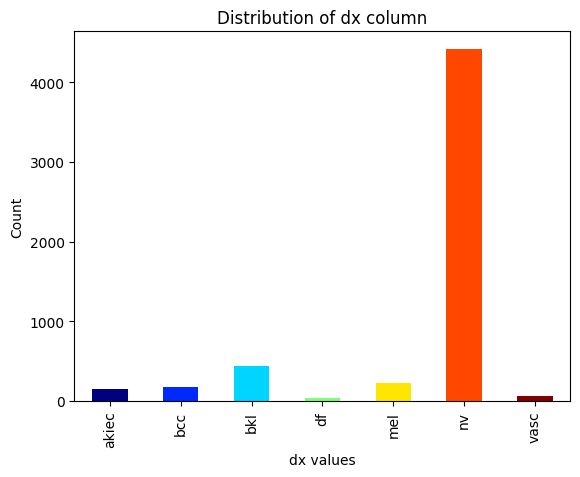

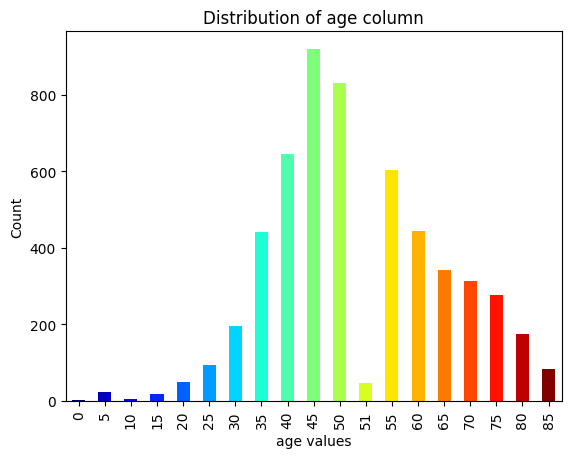

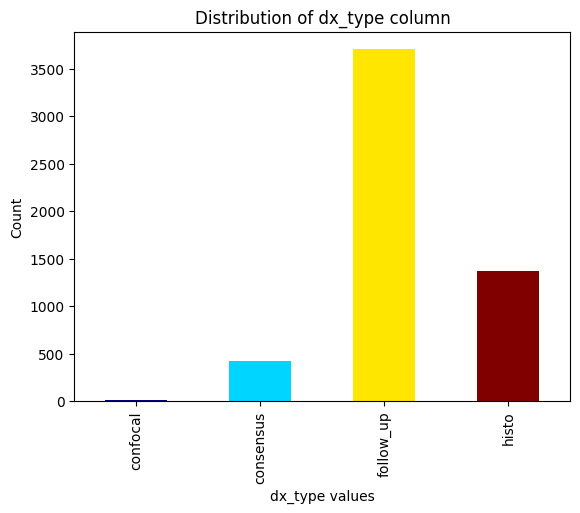

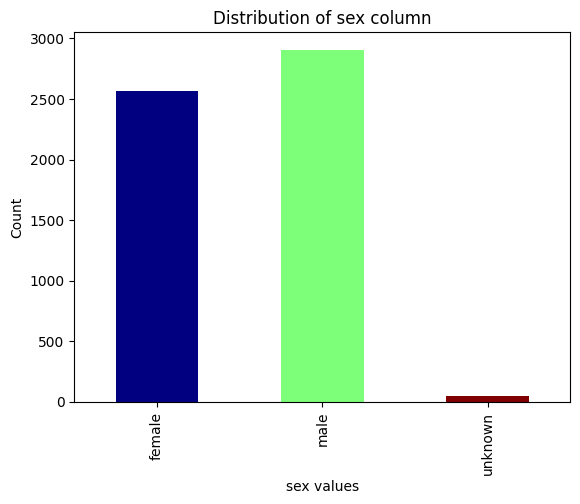

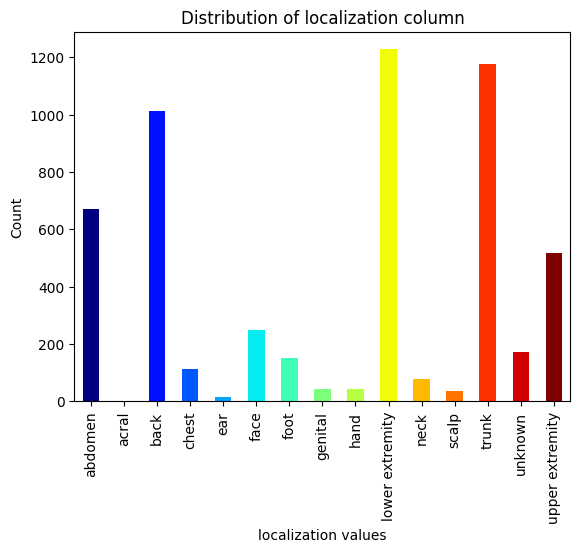

In [23]:
columns_exp = ['dx','age','dx_type', 'sex', 'localization']

for column in columns_exp:
  count = metadata[column].value_counts().sort_index()

  unique_vals = count.index
  colors = plt.cm.jet(np.linspace(0, 1, len(unique_vals)))

  count.plot(kind='bar', color=colors)

  plt.xlabel(f'{column} values')
  plt.ylabel('Count')
  plt.title(f'Distribution of {column} column')
  plt.show()

In [24]:
metadata.loc[metadata['sex']=='unknown'].shape

(45, 9)

In [25]:
metadata.loc[metadata['localization']=='unknown'].shape

(173, 9)

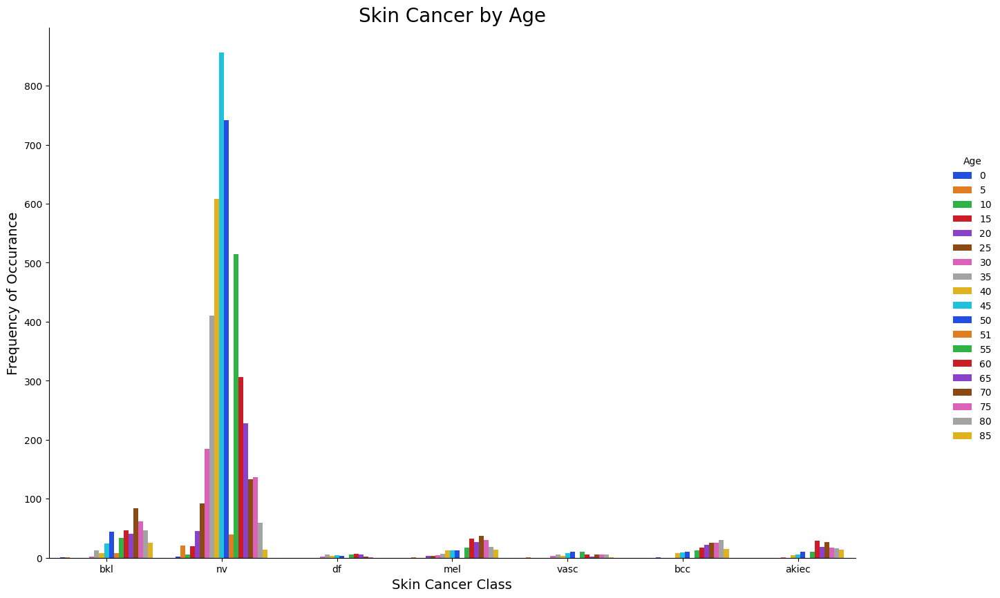

In [26]:
#Skin Cancer by age
g = sns.catplot(x="dx", kind="count", hue="age", palette='bright', data=metadata)
g.fig.set_size_inches(16, 9)

g.ax.set_title('Skin Cancer by Age', fontsize=20)
g.set_xlabels('Skin Cancer Class', fontsize=14)
g.set_ylabels('Frequency of Occurance', fontsize=14)
g._legend.set_title('Age')

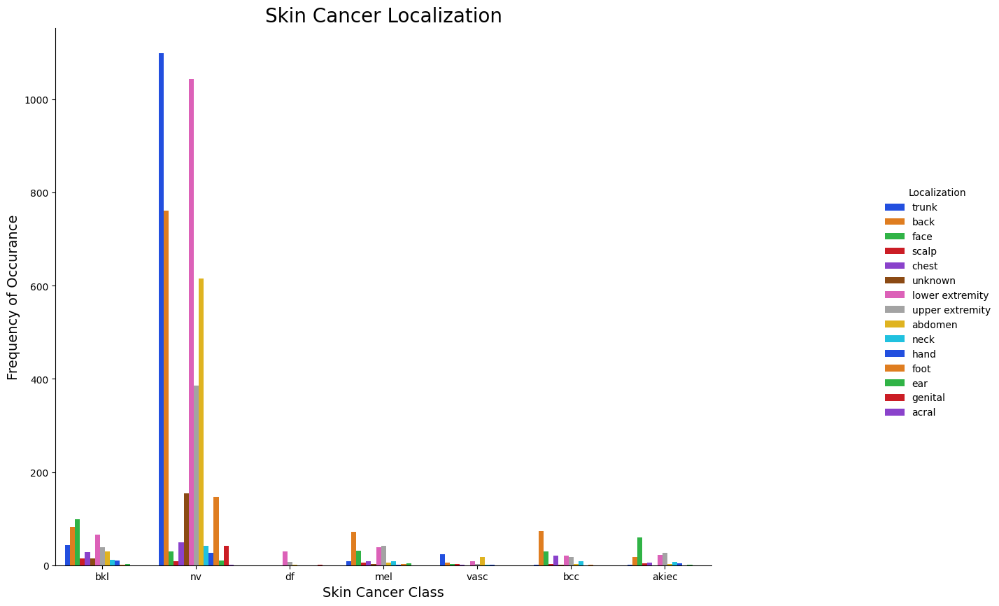

In [27]:
g = sns.catplot(x="dx", kind="count", hue="localization", palette='bright', data=metadata)
g.fig.set_size_inches(16, 9)

g.ax.set_title('Skin Cancer Localization', fontsize=20)
g.set_xlabels('Skin Cancer Class', fontsize=14)
g.set_ylabels('Frequency of Occurance', fontsize=14)
g._legend.set_title('Localization')

In [28]:
metadata.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dup_les,image_path
10,HAM_0001396,ISIC_0025276,bkl,histo,55,female,trunk,False,HAM10000_images_part_1/bkl/ISIC_0025276.jpg
15,HAM_0007207,ISIC_0031326,bkl,histo,65,male,back,False,HAM10000_images_part_2/bkl/ISIC_0031326.jpg
20,HAM_0006071,ISIC_0032343,bkl,histo,70,female,face,False,HAM10000_images_part_2/bkl/ISIC_0032343.jpg
33,HAM_0005612,ISIC_0024981,bkl,histo,80,male,scalp,False,HAM10000_images_part_1/bkl/ISIC_0024981.jpg
34,HAM_0005388,ISIC_0027815,bkl,histo,80,male,chest,False,HAM10000_images_part_1/bkl/ISIC_0027815.jpg


In [29]:
def pltImg(images, labels, row_num, col_num):
    fig, axes = plt.subplots(row_num, col_num, figsize=(15, 8))
    axes = axes.ravel()  # Flatten axes array

    for i, image in enumerate(images):
        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(f"Class: {labels[i]}\nMean intensity: {np.mean(image):.1f}")

    plt.tight_layout()
    plt.show()


def pltHist(images, labels, row_num, col_num):
    fig, axes = plt.subplots(row_num, col_num, figsize=(15, 8))
    axes = axes.ravel()  # Flatten axes array
    colors = ["red", "green", "blue"]

    for i, image in enumerate(images):
        image_array = np.array(image)

        # Plotting all channels with colors
        for channel in range(3):
            hist, bin_edges = np.histogram(image_array[:, :, channel], bins=256, range=(0, 256))
            axes[i].plot(bin_edges[:-1], hist, color=colors[channel])

        axes[i].set_title(f"Class: {labels[i]}")

    plt.tight_layout()
    plt.show()


In [30]:
# def equalize_image(image):
#     # Convert image to numpy array
#     image_array = np.array(image)

#     # Split the channels
#     r, g, b = cv2.split(image_array)

#     # Equalize each channel
#     r_eq = cv2.equalizeHist(r)
#     g_eq = cv2.equalizeHist(g)
#     b_eq = cv2.equalizeHist(b)

#     # Merge equalized channels
#     image_eq = cv2.merge((r_eq, g_eq, b_eq))

#     return image_eq

# def pltImgEq(images, labels, row_num, col_num):
#     fig, axes = plt.subplots(row_num, col_num, figsize=(15, 8))
#     axes = axes.ravel()  # Flatten axes array

#     for i, image in enumerate(images):
#         # Equalize the image
#         image_eq = equalize_image(image)

#         # Show the equalized image
#         axes[i].imshow(cv2.cvtColor(image_eq, cv2.COLOR_BGR2RGB))  # Convert colors from BGR to RGB
#         axes[i].axis('off')
#         axes[i].set_title(f"Class: {labels[i]}\nMean intensity: {np.mean(image_eq):.1f}")

#     plt.tight_layout()
#     plt.show()

In [31]:
def randImg(df, label, seed, sample_size):
    # Filter dataframe for specific label/class
    df_class = df[df['dx'] == label]

    # Randomly sample images from this class
    random.seed(seed)
    sample_df = df_class.sample(n=sample_size)

    images = []
    labels = []
    for index, row in sample_df.iterrows():
        image_path = row['image_path']
        if os.path.exists(image_path):
            image = Image.open(image_path)
            images.append(image)
            labels.append(label)
        else:
            print(f"Image not found: {image_path}")

    return images, labels


--- Showcasing examples for class: bkl ---



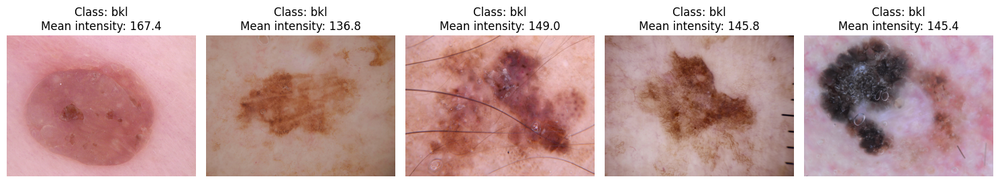

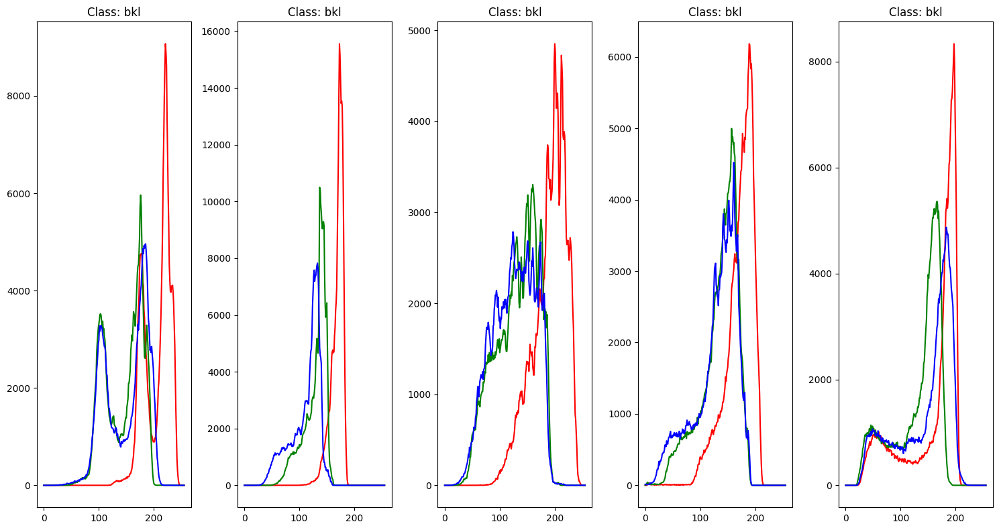


--- Showcasing examples for class: nv ---



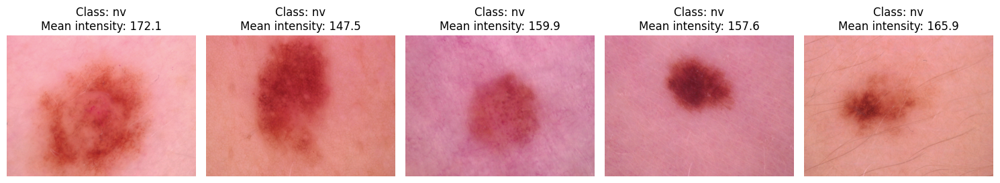

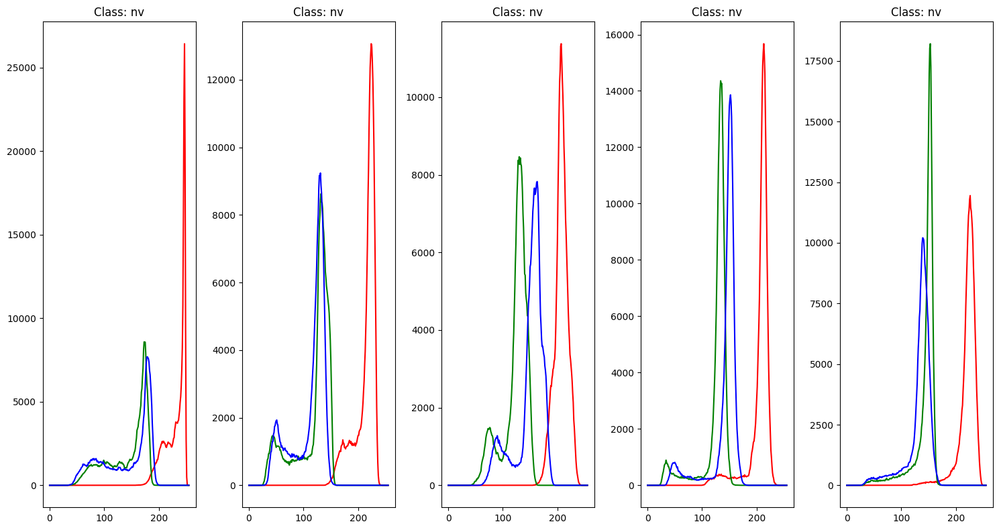


--- Showcasing examples for class: df ---



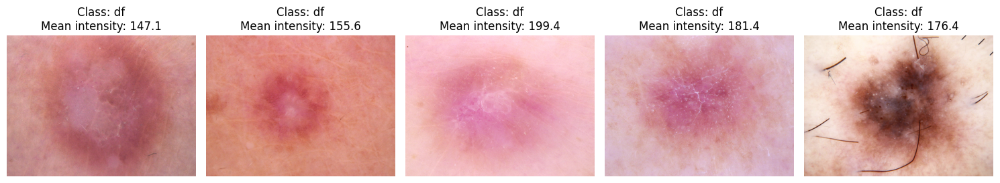

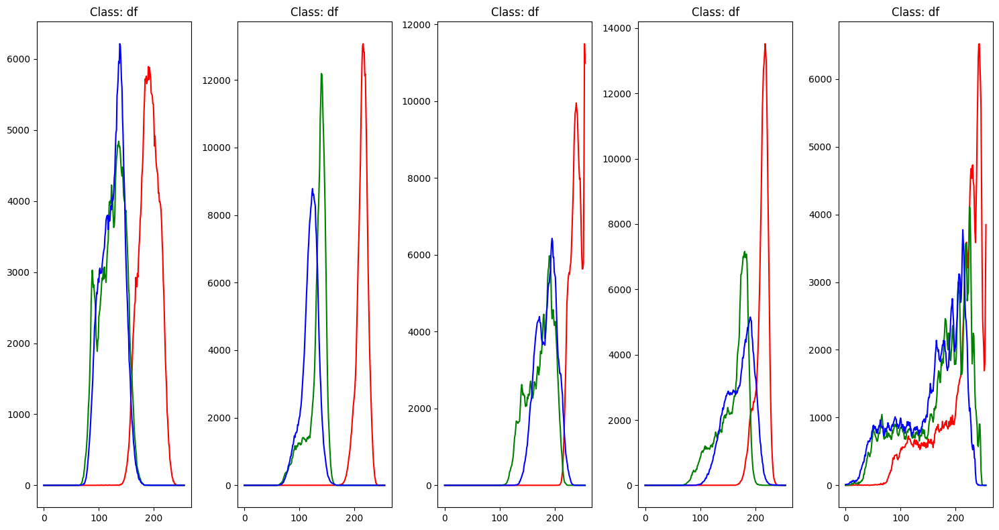


--- Showcasing examples for class: mel ---



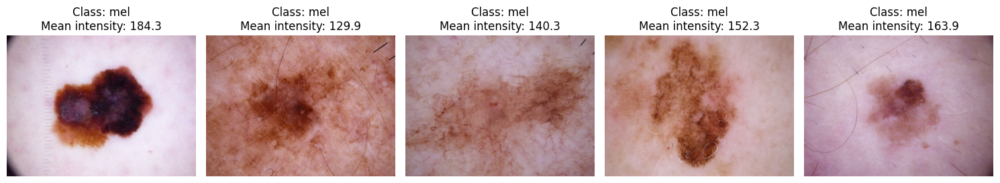

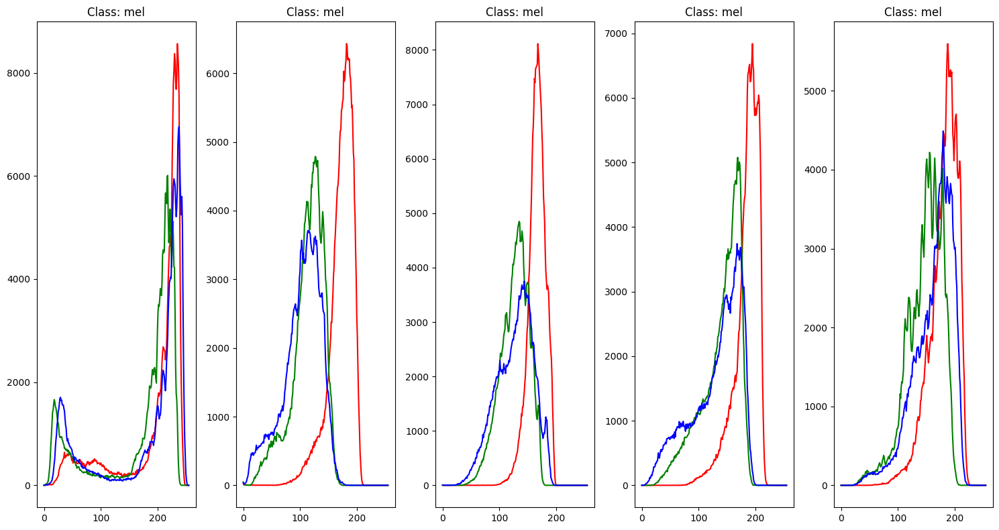


--- Showcasing examples for class: vasc ---



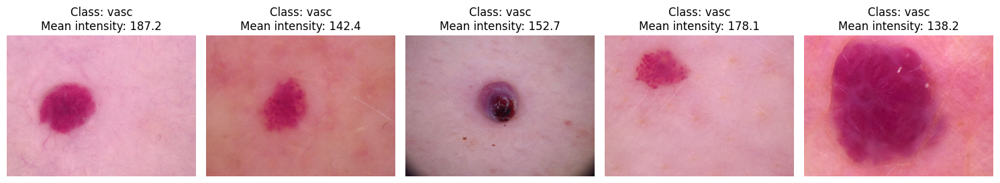

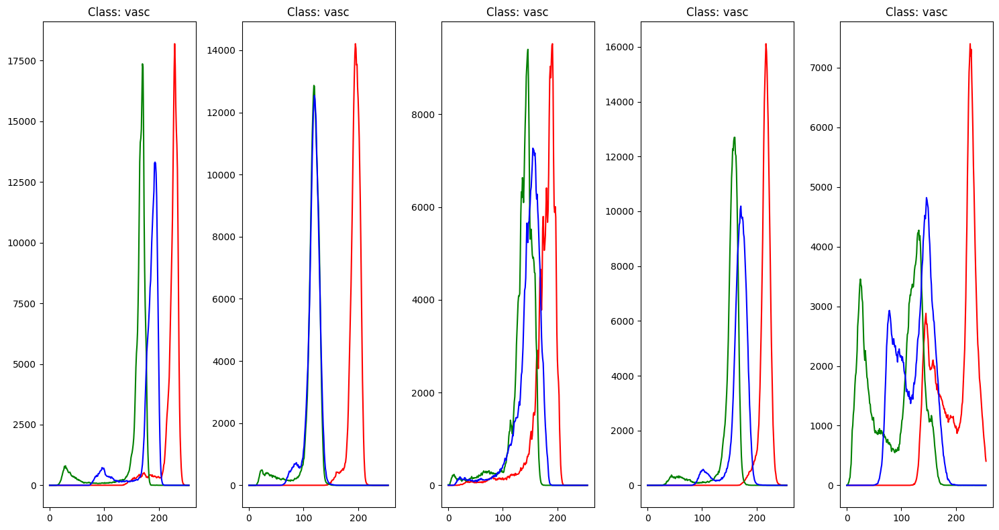


--- Showcasing examples for class: bcc ---



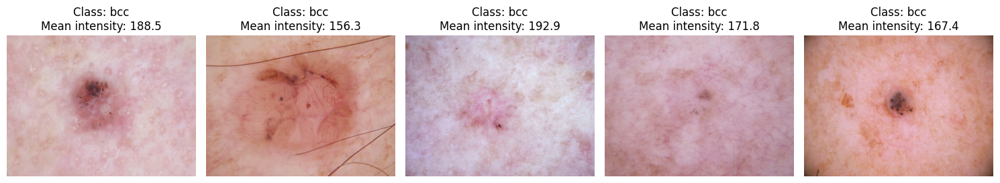

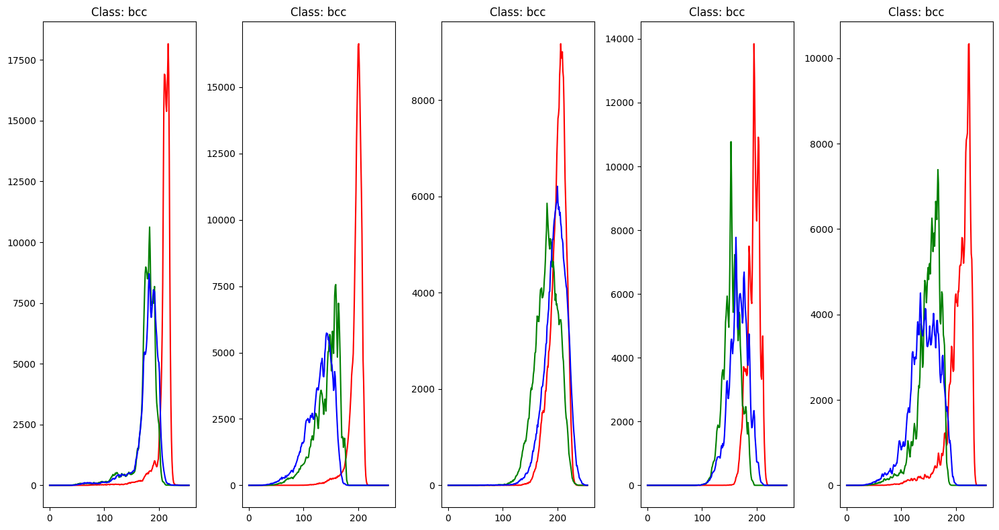


--- Showcasing examples for class: akiec ---



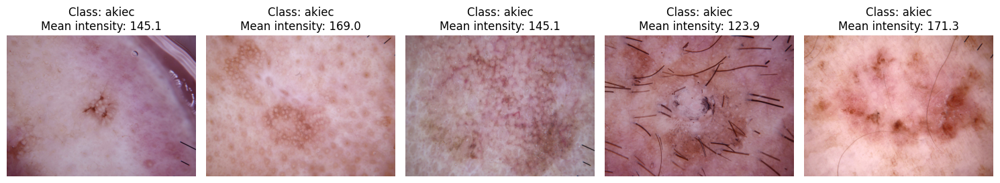

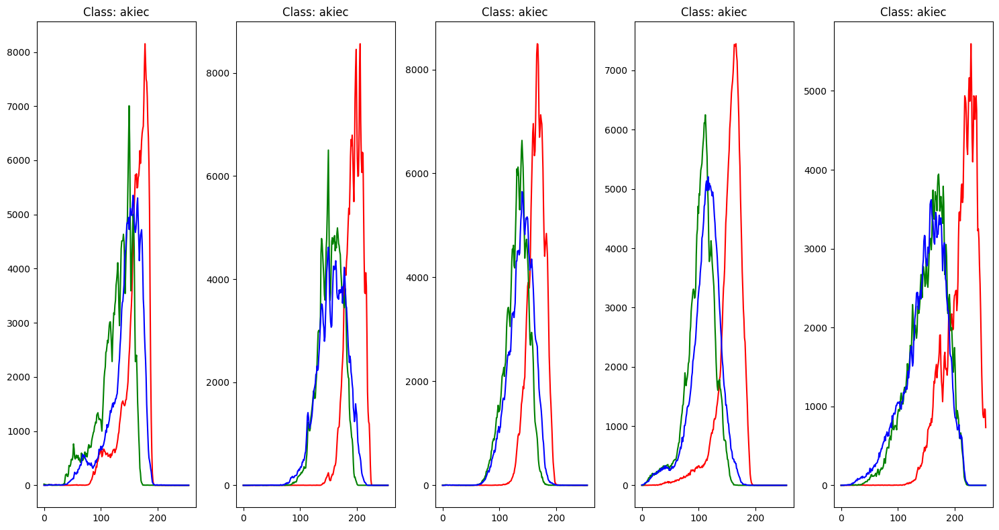

In [32]:
class_labels = ['bkl', 'nv', 'df', 'mel', 'vasc', 'bcc', 'akiec']

for class_label in class_labels:
    print(f"\n--- Showcasing examples for class: {class_label} ---\n")
    images, labels = randImg(df=metadata, label=class_label, seed=42, sample_size=5)

    # For displaying images
    pltImg(images, labels, 1, 5)
    # pltImgEq(images, labels, 1, 5)
    # For displaying histograms
    pltHist(images, labels, 1, 5)


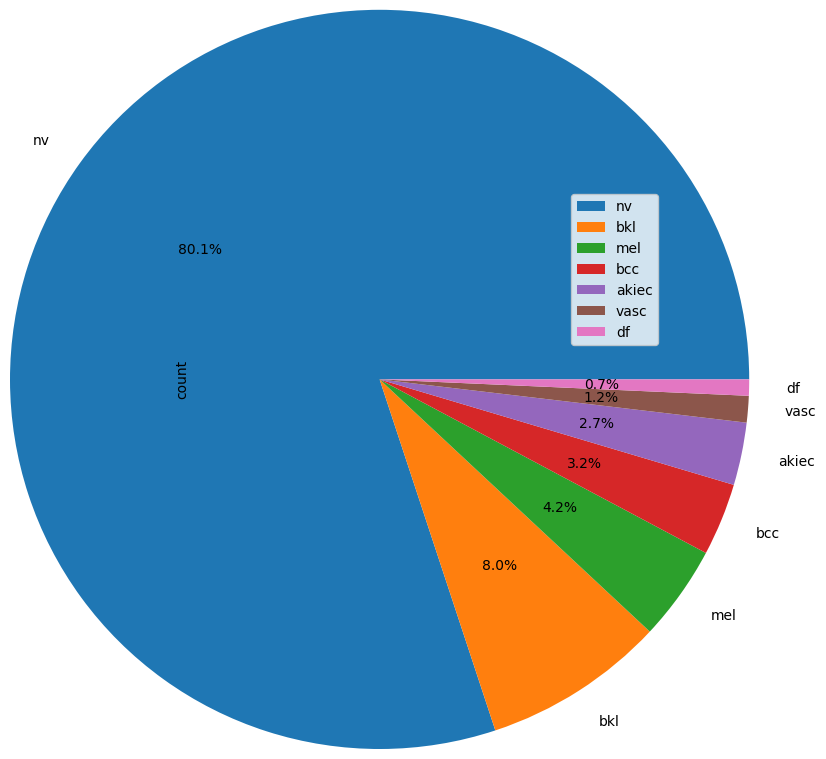

In [33]:
count = metadata['dx'].value_counts()
ax = count.plot(kind="pie", autopct='%1.1f%%', legend=True,radius=2.5)
ax.legend(bbox_to_anchor=(1, 1.02), loc='upper left')
plt.show()

In [34]:
count

dx
nv       4415
bkl       440
mel       230
bcc       175
akiec     151
vasc       64
df         39
Name: count, dtype: int64


LABELS :

1. Melanocytic nevi (nv) -

Melanocytic nevi are benign neoplasms of melanocytes and appear in a myriad of variants, which all are included in our series. The variants may differ significantly from a dermatoscopic point of view.

[4415 images]

2. Melanoma (mel) -

Melanoma is a malignant neoplasm derived from melanocytes that may appear in different variants. If excised in an early stage it can be cured by simple surgical excision. Melanomas can be invasive or non-invasive (in situ). We included all variants of melanoma including melanoma in situ, but did exclude non-pigmented, subungual, ocular or mucosal melanoma.

[230 images]

3. Benign keratosis-like lesions (bkl) -

"Benign keratosis" is a generic class that includes seborrheic ker- atoses ("senile wart"), solar lentigo - which can be regarded a flat variant of seborrheic keratosis - and lichen-planus like keratoses (LPLK), which corresponds to a seborrheic keratosis or a solar lentigo with inflammation and regression [22]. The three subgroups may look different dermatoscop- ically, but we grouped them together because they are similar biologically and often reported under the same generic term histopathologically. From a dermatoscopic view, lichen planus-like keratoses are especially challeng- ing because they can show morphologic features mimicking melanoma [23] and are often biopsied or excised for diagnostic reasons.

[440 images]

4. Basal cell carcinoma (bcc) -

Basal cell carcinoma is a common variant of epithelial skin cancer that rarely metastasizes but grows destructively if untreated. It appears in different morphologic variants (flat, nodular, pigmented, cystic, etc) [21], which are all included in this set.

[175 images]

5. Actinic keratoses (akiec) -

Actinic Keratoses (Solar Keratoses) and intraepithelial Carcinoma (Bowen’s disease) are common non-invasive, variants of squamous cell car- cinoma that can be treated locally without surgery. Some authors regard them as precursors of squamous cell carcinomas and not as actual carci- nomas. There is, however, agreement that these lesions may progress to invasive squamous cell carcinoma - which is usually not pigmented. Both neoplasms commonly show surface scaling and commonly are devoid of pigment. Actinic keratoses are more common on the face and Bowen’s disease is more common on other body sites. Because both types are in- duced by UV-light the surrounding skin is usually typified by severe sun damaged except in cases of Bowen’s disease that are caused by human papilloma virus infection and not by UV. Pigmented variants exists for Bowen’s disease [19] and for actinic keratoses [20]. Both are included in this set.

[151 images]

6. Vascular lesions (vasc) -

Vascular skin lesions in the dataset range from cherry angiomas to angiokeratomas [25] and pyogenic granulomas [26]. Hemorrhage is also included in this category.

[64 images]

7. Dermatofibrom (df) -

Dermatofibroma is a benign skin lesion regarded as either a benign proliferation or an inflammatory reaction to minimal trauma. It is brown often showing a central zone of fibrosis dermatoscopically [24].

[39 images]

[Total images = 5514]


# Data Augmentation

In [35]:
metadata.dx.unique()

array(['bkl', 'nv', 'df', 'mel', 'vasc', 'bcc', 'akiec'], dtype=object)

In [36]:
count = metadata['dx'].value_counts().sort_index()
count

dx
akiec     151
bcc       175
bkl       440
df         39
mel       230
nv       4415
vasc       64
Name: count, dtype: int64

<Axes: ylabel='count'>

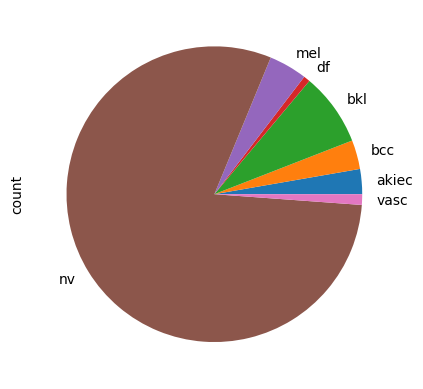

In [37]:
count.plot(kind='pie')

We can observe the huge imbalance between classes.

In [38]:
def data_aug(df, col_name, val_name, class_max):
  ''' This function balances the classes by 2 using the overrepresentation of the minor class'''
  given_cols = df[df[col_name].isin([val_name, class_max])]
  class_counts = df[col_name].value_counts()
  class_count_max = class_counts[class_max]
  class_count_val = class_counts[val_name]
  max_class = given_cols[given_cols[col_name]==class_max]
  val_class = given_cols[given_cols[col_name]==val_name]
  val_class_over = val_class.sample(class_count_max,replace= True)
  df = df[df[col_name] != val_name]
  df = pd.concat([df,val_class_over],axis=0)
  return df

In [39]:
class_max = count.idxmax()

for val_name in metadata.dx.unique():
  if val_name != class_max:
    metadata = data_aug(metadata,'dx',val_name,class_max)

metadata.shape

(30905, 9)

<Axes: ylabel='count'>

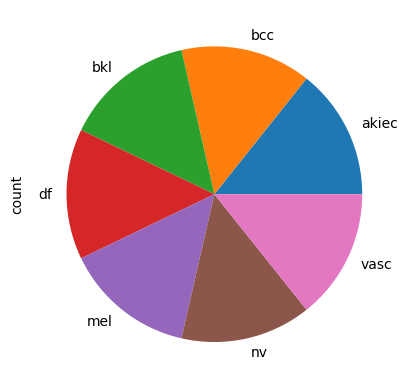

In [40]:
count = metadata['dx'].value_counts().sort_index()
count.plot(kind='pie')

# Data export

For metadata['dx']:

   *'bkl': 0, 'nv': 1, 'df': 2, 'mel': 3, 'vasc': 4, 'bcc': 5, 'akiec': 6*

For metadata['dx_type']:

   *'histo': 0, 'consensus':1, 'confocal':2, 'follow_up':3*

For metadata['localization']:

  *'scalp':0, 'ear':1, 'face':2, 'back':3, 'trunk':4, 'chest':5,'upper extremity':6, 'abdomen':7, 'lower extremity':8, 'genital':9, 'neck':10,
  'hand':11, 'foot':12, 'acral':13*

For metadata['sex']:

  *'male':0, 'female':1*

In [44]:
enum_labels = {'bkl': 0, 'nv': 1, 'df': 2, 'mel': 3, 'vasc': 4, 'bcc': 5, 'akiec': 6}

metadata['dx'] = metadata['dx'].replace(enum_labels)

In [47]:
metadata.dx.unique()

array([1, 0, 2, 3, 4, 5, 6])

In [48]:
metadata.to_csv('data_enum.csv', index=False)

# Convert to Tensors

In [ ]:
enum_dx_type = {'histo':0, 'consensus':1, 'confocal':2, 'follow_up':3}
enum_localization = {'scalp':0, 'ear':1, 'face':2, 'back':3, 'trunk':4, 'chest':5,
       'upper extremity':6, 'abdomen':7, 'lower extremity':8, 'genital':9, 'neck':10,
       'hand':11, 'foot':12, 'acral':13}

metadata['dx_type'] = metadata['dx_type'].replace(enum_dx_type)
metadata['localization'] = metadata['localization'].replace(enum_localization)

In [ ]:
enum_sex = {'male':0, 'female':1}

metadata['sex'] = metadata['sex'].replace(enum_sex)

In [ ]:
# dx_type_encoder = LabelEncoder()
# metadata['dx_type'] = dx_type_encoder.fit_transform(metadata['dx_type'])

# localization_encoder = LabelEncoder()
# metadata['localization'] = localization_encoder.fit_transform(metadata['localization'])

In [ ]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46935 entries, 64 to 9998
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   lesion_id     46935 non-null  object
 1   image_id      46935 non-null  object
 2   dx            46935 non-null  int64 
 3   dx_type       46935 non-null  int64 
 4   age           46935 non-null  int64 
 5   sex           46935 non-null  int64 
 6   localization  46935 non-null  int64 
 7   image_path    46935 non-null  object
dtypes: int64(5), object(3)
memory usage: 3.2+ MB


In [ ]:
scaler = StandardScaler()
metadata[['dx_type','age','localization']] = scaler.fit_transform(metadata[['dx_type','age','localization']])
metadata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46935 entries, 64 to 9998
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     46935 non-null  object 
 1   image_id      46935 non-null  object 
 2   dx            46935 non-null  int64  
 3   dx_type       46935 non-null  float64
 4   age           46935 non-null  float64
 5   sex           46935 non-null  int64  
 6   localization  46935 non-null  float64
 7   image_path    46935 non-null  object 
dtypes: float64(3), int64(2), object(3)
memory usage: 3.2+ MB


In [ ]:
class HAM10000Dataset(Dataset):
    def __init__(self, metadata, transform_color=None, transform_gray=None):
        self.metadata = metadata
        self.transform_color = transform_color
        self.transform_gray = transform_gray

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        image_path = self.metadata.iloc[idx]['image_path']
        image = Image.open(image_path)

        # Transformations
        image_color = self.transform_color(image) if self.transform_color else image
        image_gray = self.transform_gray(image) if self.transform_gray else image

        # Metadata
        age = torch.tensor(self.metadata.iloc[idx]['age'])
        sex = torch.tensor(self.metadata.iloc[idx]['sex'])
        dx_type = torch.tensor(self.metadata.iloc[idx]['dx_type'])
        localization = torch.tensor(self.metadata.iloc[idx]['localization'])

        labels = torch.tensor(self.metadata.iloc[idx]['dx'])

        # # Compute histograms
        # pixels = num_of_pix**2
        # hist_color = [torch.histc(channel, bins=256, min=0, max=1)/num_of_pix for channel in image_color.chunk(3, dim=0)]
        # hist_gray = torch.histc(image_gray, bins=256, min=0, max=1)/num_of_pix

        return image_color, image_gray, age, sex, labels, dx_type, localization#, hist_color, hist_gray

In [ ]:
num_of_pix=224
transform_color = transforms.Compose([
    transforms.Resize((num_of_pix, num_of_pix)),
    transforms.ToTensor()
])

transform_gray = transforms.Compose([
    transforms.Resize((num_of_pix, num_of_pix)),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor()
])

In [ ]:
metadata = metadata.sample(frac=1)

train_val_metadata, test_metadata = train_test_split(metadata, test_size=0.2, random_state=42)

train_metadata, val_metadata = train_test_split(train_val_metadata, test_size=0.25, random_state=42)

train_dataset = HAM10000Dataset(train_metadata, transform_color, transform_gray)
val_dataset = HAM10000Dataset(val_metadata, transform_color, transform_gray)
test_dataset = HAM10000Dataset(test_metadata, transform_color, transform_gray)

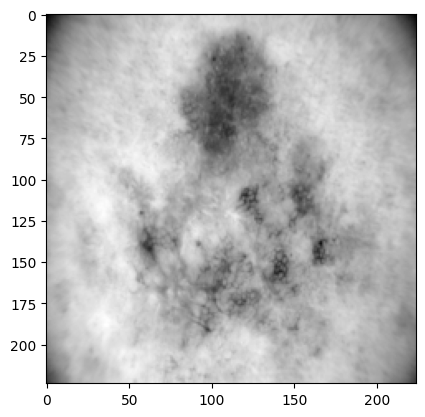

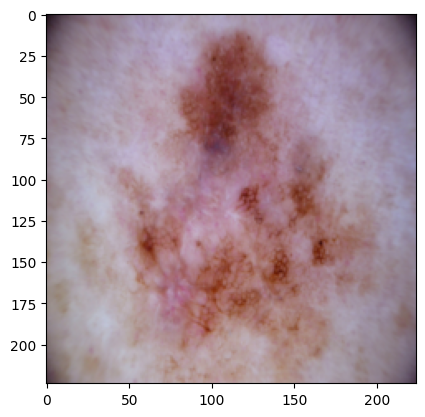

In [ ]:
rand = random.randint(0, train_metadata.shape[0])

# Illustrate a random image from the dataset
def plot_tensor_img(train_metadata,rand):
  colored_array = train_dataset[rand][0].permute(1, 2, 0).numpy()
  colored_array = (colored_array * 255).astype('uint8')
  gray_array = train_dataset[rand][1].squeeze(0).numpy()
  gray_array = (gray_array * 255).astype('uint8')

  plt.imshow(gray_array, cmap='gray')
  plt.show()

  plt.imshow(colored_array)
  plt.show()

plot_tensor_img(train_dataset,rand)

In [ ]:
# dataset = HAM10000Dataset(metadata,transform_color,transform_gray)

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

# **Model**

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class MultiBranchModel(nn.Module):
    def __init__(self, trial):
        super(MultiBranchModel, self).__init__()

        # Optuna will suggest the number of units for each layer
        self.conv1 = nn.Conv2d(3, trial.suggest_int("n_units_l1", 16, 64), kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(trial.suggest_int("n_units_l1", 16, 64), trial.suggest_int("n_units_l2", 32, 128), kernel_size=3, stride=1, padding=1)
        # ... other convolutional layers for colored images ...

        self.conv_gray1 = nn.Conv2d(1, trial.suggest_int("n_units_gray_l1", 16, 64), kernel_size=3, stride=1, padding=1)
        self.conv_gray2 = nn.Conv2d(trial.suggest_int("n_units_gray_l1", 16, 64), trial.suggest_int("n_units_gray_l2", 32, 128), kernel_size=3, stride=1, padding=1)
        # ... other convolutional layers for gray scaled images ...

        # Metadata fully connected layers
        self.fc_meta = nn.Linear(4, trial.suggest_int("n_units_meta", 16, 64))  # Assuming 4 metadata features

        # Combined fully connected layers
        self.fc1_combined = nn.Linear(trial.suggest_int("n_units_l2", 32, 128) * num_of_pix * num_of_pix + trial.suggest_int("n_units_gray_l2", 32, 128) * num_of_pix * num_of_pix + trial.suggest_int("n_units_meta", 16, 64), trial.suggest_int("n_units_combined", 64, 256))
        self.fc2_combined = nn.Linear(trial.suggest_int("n_units_combined", 64, 256), 7)  # num_classes is the number of your target classes

    def forward(self, image_color, image_gray, metadata):
        # Colored image branch
        x1 = F.relu(self.conv1(image_color))
        x1 = F.relu(self.conv2(x1))
        # ... other layers ...
        x1 = x1.view(x1.size(0), -1)  # Flatten the output

        # Gray image branch
        x2 = F.relu(self.conv_gray1(image_gray))
        x2 = F.relu(self.conv_gray2(x2))
        # ... other layers ...
        x2 = x2.view(x2.size(0), -1)  # Flatten the output

        # Metadata branch
        x3 = F.relu(self.fc_meta(metadata))

        # Combine branches
        x = torch.cat((x1, x2, x3), dim=1)  # Concatenate the features from each branch

        # Fully connected layers after combining
        x = F.relu(self.fc1_combined(x))
        x = self.fc2_combined(x)

        return x


In [ ]:
import optuna

def objective(trial):
    # Create a multi-branch model with the current set of hyperparameters
    model = MultiBranchModel(trial)

    # Define your loss function, optimizer, and other components of the training process
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=trial.suggest_float("lr", 1e-5, 1e-1, log=True))
    val_losses = []
    # Training loop (simplified)
    for epoch in range(5):
        model.train()
        for image_color, image_gray, age, sex, labels, dx_type, localization in train_loader:  # Assuming you have a DataLoader
            optimizer.zero_grad()
            metadata = torch.stack((age, sex, dx_type, localization), dim=1)  # Combine your metadata here
            outputs = model(image_color, image_gray, metadata)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

        model.eval()  # Set the model to evaluation mode
        val_loss = 0.0
        with torch.no_grad():  # No need to track the gradients
            for image_color, image_gray, age, sex, labels, dx_type, localization in val_loader:  # Assuming you have a DataLoader for validation
                metadata = torch.stack((age, sex, dx_type, localization), dim=1)  # Combine your metadata here
                outputs = model(image_color, image_gray, metadata)
                loss = criterion(outputs, labels)
                val_loss += loss.item()  # Summing up the loss

        # Here, calculate the average validation loss
        avg_val_loss = val_loss / len(val_loader.dataset)
        val_losses.append(avg_val_loss)

    # You might want to return the best (lowest) validation loss during the trials, or the last one, depending on your strategy.
    return min(val_losses)  # Optuna will optimize based on this metric (you should define val_loss based on your validation loop)

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)  # or however many trials you wish to run

best_params = study.best_params
best_trial = study.best_trial

print(f"Best trial: {best_trial.number}")
print(f"  Validation Loss: {best_trial.value}")
print(f"  Params: {best_params}")



[I 2023-10-22 09:43:39,836] A new study created in memory with name: no-name-cc796324-5a4d-4964-8d7a-9ec43a27d0b1
[W 2023-10-22 09:44:08,500] Trial 0 failed with parameters: {'n_units_l1': 28, 'n_units_l2': 65, 'n_units_gray_l1': 24, 'n_units_gray_l2': 122, 'n_units_meta': 40, 'n_units_combined': 107, 'lr': 0.00785804749606297} because of the following error: RuntimeError('mat1 and mat2 must have the same dtype, but got Double and Float').
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "<ipython-input-39-2e84f8321e1b>", line 17, in objective
    outputs = model(image_color, image_gray, metadata)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py", line 1527, in _call_impl
    return f

RuntimeError: ignored

In [ ]:
class metadataModel(nn.Module):
    def __init__(self, input_size, hidden_layer_size, output_size):
        super(metadataModel, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_layer_size)  # First fully connected layer
        self.relu = nn.ReLU()                                # Activation function
        self.fc2 = nn.Linear(hidden_layer_size, output_size) # Second fully connected layer

    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        return out


In [ ]:
class NaturalSceneClassification(ImageClassificationBase):
    def __init__(self):
        super().__init__()
        self.network = nn.Sequential(

            nn.Conv2d(3, 32, kernel_size = 3, padding = 1),
            nn.ReLU(),
            nn.Conv2d(32,64, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),

            nn.Conv2d(64, 128, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.Conv2d(128 ,128, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),

            nn.Conv2d(128, 256, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.Conv2d(256,256, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),

            nn.Flatten(),
            nn.Linear(82944,1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512,6)
        )

    def forward(self, xb):
        return self.network(xb)

NameError: ignored

In [ ]:
def initialize_model(model_name, num_classes, feature_extract, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0

    if model_name == "resnet":
        """ Resnet18, resnet34, resnet50, resnet101
        """
        model_ft = models.resnet50(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 224
o

    elif model_name == "vgg":
        """ VGG11_bn
        """
        model_ft = models.vgg11_bn(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224


    elif model_name == "densenet":
        """ Densenet121
        """
        model_ft = models.densenet121(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model_ft = models.inception_v3(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        # Handle the auxilary net
        num_ftrs = model_ft.AuxLogits.fc.in_features
        model_ft.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs,num_classes)
        input_size = 299

    else:
        print("Invalid model name, exiting...")
        exit()
    return model_ft, input_size

IndentationError: ignored

In [ ]:
def image_analysis(image_sel,class_sel=None):
  data_point = dataset[image_sel]
  colored_image = data_point[0]
  grayscaled_image = data_point[1]
  # colored_histogram = data_point[-2]
  # grayscaled_histogram = data_point[-1]

  class_label = enum_label[int(data_point[5])]

  colored_image_np = colored_image.numpy().transpose(1, 2, 0)  # Convert CxHxW to HxWxC for visualization
  grayscaled_image_np = grayscaled_image.numpy().squeeze()  # Remove the channel dimension for grayscale
  colored_histogram_np=[]
  # for i in range(len(colored_histogram)):
  #   colored_histogram_np.append(colored_histogram[i].numpy())
  # grayscaled_histogram_np = grayscaled_histogram.numpy()

  # RGB image
  plt.imshow(colored_image_np)
  plt.title(f"Colored Image - Class: {class_label}")
  plt.show()

  # # RGB Histogram
  # plt.figure(figsize=(10, 6))
  # plt.bar(np.arange(256), colored_histogram_np[0], color='r', label='Red')
  # plt.bar(np.arange(256), colored_histogram_np[1], color='g', label='Green')
  # plt.bar(np.arange(256), colored_histogram_np[2], color='b', label='Blue')
  # plt.title("Colored Histogram")
  # plt.xlabel("Pixel Value")
  # plt.ylabel("Normalized Frequency")
  # plt.legend()
  # plt.grid(True)
  # plt.show()

  # Grayscale image
  plt.imshow(grayscaled_image_np, cmap='gray')
  plt.title(f"Grayscale Image - Class: {class_label}")
  plt.show()

  # # Grayscale Histogram
  # plt.figure(figsize=(10, 6))
  # plt.bar(np.arange(256), grayscaled_histogram_np, color='gray')
  # plt.title("Grayscale Histogram")
  # plt.xlabel("Pixel Value")
  # plt.ylabel("Normalized Frequency")
  # plt.grid(True)
  # plt.show()



In [ ]:
# Check a random image
image_analysis(rand)

NameError: ignored

# Split

In [ ]:
train_set, val_set = torch.utils.data.random_split(dataset, [6015, 4000])
val_set, test_set = torch.utils.data.random_split(val_set, [2000, 2000])

# CNN Model

In [ ]:
class CNNModel(nn.Module):
    def __init__(self, num_classes=7):
        super(CNNModel, self).__init__()

        # Colored Image Branch
        self.color_branch = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Flatten()
        )

        # Grayscale Image Branch
        self.gray_branch = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Flatten()
        )

        # Combined branch (merging the outputs of the above branches)
        self.combined = nn.Sequential(
            nn.Linear(2050, 512),  # adjust these dimensions based on your earlier layers
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 7)
        )

        # Metadata Branch (assuming metadata is a tensor of size 10 for simplicity)
        self.metadata_branch = nn.Sequential(
            nn.Linear(4, 128),
            nn.ReLU(),
            nn.Linear(128, 2),
            nn.ReLU()
        )

    def forward(self, x_color, x_gray, x_meta):  # This is now aligned with __init__
        x1 = self.color_branch(x_color)
        x2 = self.gray_branch(x_gray)
        # x3 = self.histogram_branch(x_hist)
        x3 = self.metadata_branch(x_meta)


        # Concatenate along the last dimension
        x = torch.cat((x1, x2, x3), dim=1)
        print(x.shape)
        return self.combined(x)

model = CNNModel()

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

num_epochs=2
# trainloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True)

for epoch in range(num_epochs):
    for image_color, image_gray, age, sex, labels, dx_type, localization in train_set:
        # Zero the parameter gradients
        optimizer.zero_grad()

        # hist_color_tensor = torch.stack(hist_color).float()

        x_meta = torch.cat([
            age.unsqueeze(0),
            sex.unsqueeze(0),
            dx_type.unsqueeze(0),
            localization.unsqueeze(0)
        ], dim=0).unsqueeze(0)
        x_meta = x_meta.float()
        x_meta = x_meta.repeat(64, 1)


        inputs = [image_color, image_gray, age, sex, dx_type, localization]

        # Forward pass
        outputs = model(image_color, image_gray, x_meta)
        print(outputs.shape)

        # Compute the loss
        loss = criterion(outputs, labels)  # labels are used here

        # Backward pass and optimization
        loss.backward()
        optimizer.step()


torch.Size([64, 2050])
torch.Size([64, 7])


ValueError: ignored

In [ ]:
print("image_color:", image_color.dtype)
print("image_gray:", image_gray.dtype)
print("x_meta:", x_meta.dtype)



image_color: torch.float32
image_gray: torch.float32
x_meta: torch.float64


In [ ]:
def objective(trial):
    n_layers = trial.suggest_int("n_layers", 1, 7)
    out_channels = trial.suggest_categorical("out_channels", [32, 64, 128, 256])
    pool_type = trial.suggest_categorical("pool_type", ["max", "avg","min"])
    kernel_size = trial.suggest_int("kernel_size", 3, 9)
    fc_units = trial.suggest_categorical("fc_units", [128, 256, 512])

    # 2. Create model based on the suggested hyperparameters
    model = CNNModel(n_layers, out_channels, pool_type, kernel_size, fc_units)

    optimizer = optim.Adam(model.parameters(), lr=trial.suggest_float("lr", 1e-5, 1e-1, log=True))
    criterion = nn.CrossEntropyLoss()

    # 3. Training loop (simplified for illustration)
    for epoch in range(EPOCHS):
        for batch in train_loader:
            # ... forward, loss computation, backpropagation
            optimizer.zero_grad()
            outputs = model(batch)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

    # 4. Validation evaluation
    val_loss = 0
    with torch.no_grad():
        for batch in valid_loader:
            # ... forward, loss computation
            outputs = model(batch)
            val_loss += criterion(outputs, labels).item()

    return val_loss / len(valid_loader)

**Manual**

In [ ]:
mycallbacks = [
    EarlyStopping(monitor='accuracy', patience=3),
    ModelCheckpoint(filepath='best_model.h5', save_best_only=True),
    TensorBoard(log_dir='./logs')
]

In [ ]:
# Create an empty Sequential model
model = Sequential()

# Add layers
model.add(Conv2D(256, kernel_size=3, activation='relu', input_shape=image_size))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(256, kernel_size=3, activation='sigmoid'))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(128, kernel_size=3, activation='relu'))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(64, kernel_size=3, activation='relu'))
model.add(MaxPool2D((2, 2)))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(number_of_classes,activation='softmax'))


In [ ]:
# Define the optimizer for the model, along with the learing rate.
optimizer = Adam(learning_rate=0.001)

In [ ]:
# Compile, build and print the model and its parameters
# Here we also specify the loss function of our model, the metrics that it should calculate, as well as the optimizer
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer=optimizer)
model.build(input_shape=(None, image_size))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 58, 78, 256)       7168      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 29, 39, 256)      0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 27, 37, 256)       590080    
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 13, 18, 256)      0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 11, 16, 128)       295040    
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 5, 8, 128)       

In [ ]:
print(X_train.shape)
print(y_train.shape)

# Train the model
model.fit(
    X_train,
    y_train,
    callbacks = mycallbacks,
    batch_size=32,
    epochs=15,
    validation_split=0.2
)

(350, 60, 80, 3)
(350, 7)
Epoch 1/15
9/9 [==============================] - 10s 181ms/step - loss: 1.2787 - accuracy: 0.6214 - val_loss: 1.0526 - val_accuracy: 0.7286
Epoch 2/15
9/9 [==============================] - 0s 45ms/step - loss: 1.1425 - accuracy: 0.6893 - val_loss: 1.0265 - val_accuracy: 0.7286
Epoch 3/15
9/9 [==============================] - 0s 44ms/step - loss: 1.1573 - accuracy: 0.6893 - val_loss: 1.0068 - val_accuracy: 0.7286
Epoch 4/15
9/9 [==============================] - 0s 43ms/step - loss: 1.1084 - accuracy: 0.6893 - val_loss: 0.9701 - val_accuracy: 0.7286
Epoch 5/15
9/9 [==============================] - 0s 47ms/step - loss: 1.0446 - accuracy: 0.6893 - val_loss: 0.9165 - val_accuracy: 0.7286


In [ ]:
# %tensorboard --logdir ./logs

<IPython.core.display.Javascript object>

In [ ]:
model.load_weights('best_model.h5')

## Predictions

In [ ]:
y_pred_prob = model.predict(X_test)

5/5 [==============================] - 0s 96ms/step


### Convert predictions to one-hot encoding

In [ ]:
y_pred = np.argmax(y_pred_prob, axis=-1)
y_pred = pd.DataFrame(tf.keras.utils.to_categorical(y_pred, num_classes=y_train.shape[1], dtype="int32"), columns=names_dictionary.keys())

## Metrics

In [ ]:
accuracy_score(y_test, y_pred)

0.7266666666666667

**VGG16**


In [ ]:
from keras.applications.vgg16 import VGG16, preprocess_input

In [ ]:
conv_base_vgg16 = VGG16(include_top=False, weights='imagenet', input_shape=image_size)
conv_base_vgg16.summary()

58889256/58889256 [==============================] - 2s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 60, 80, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 60, 80, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 60, 80, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 30, 40, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 30, 40, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 30, 40, 128)       147584    
                                                              

In [ ]:
model_VGG16= Sequential()

# Add layers
model_VGG16.add(conv_base_vgg16)
model_VGG16.add(Flatten())
model_VGG16.add(Dense(number_of_classes, activation='softmax'))

In [ ]:
optimizer = Adam(lr=0.01)
model_VGG16.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer=optimizer)
model_VGG16.build(input_shape=(None, image_size))
model_VGG16.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 1, 2, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 1024)              0         
                                                                 
 dense_4 (Dense)             (None, 7)                 7175      
                                                                 
Total params: 14,721,863
Trainable params: 14,721,863
Non-trainable params: 0
_________________________________________________________________


/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
mycallbacks = [
    EarlyStopping(monitor='accuracy', patience=3),
    ModelCheckpoint(filepath='best_model.h5', save_best_only=True),
    TensorBoard(log_dir='./logs')
]

In [ ]:
model_VGG16.fit(
    X_train,
    y_train,
    callbacks = mycallbacks,
    batch_size=32,
    epochs=10,
    validation_split=0.2
)

Epoch 1/10
9/9 [==============================] - 5s 337ms/step - loss: 3295311104.0000 - accuracy: 0.2500 - val_loss: 1.8947 - val_accuracy: 0.7286
Epoch 2/10
9/9 [==============================] - 1s 69ms/step - loss: 76.1927 - accuracy: 0.4500 - val_loss: 208.2207 - val_accuracy: 0.0571
Epoch 3/10
9/9 [==============================] - 1s 69ms/step - loss: 122.1216 - accuracy: 0.3714 - val_loss: 13.7921 - val_accuracy: 0.7286
Epoch 4/10
9/9 [==============================] - 1s 134ms/step - loss: 4.2754 - accuracy: 0.4429 - val_loss: 1.0352 - val_accuracy: 0.7286
Epoch 5/10
9/9 [==============================] - 1s 131ms/step - loss: 1.1715 - accuracy: 0.6893 - val_loss: 0.9863 - val_accuracy: 0.7286
Epoch 6/10
9/9 [==============================] - 1s 68ms/step - loss: 1.3287 - accuracy: 0.6893 - val_loss: 1.5426 - val_accuracy: 0.0857
Epoch 7/10
9/9 [==============================] - 1s 71ms/step - loss: 3.4638 - accuracy: 0.5393 - val_loss: 1.2959 - val_accuracy: 0.0857
Epoch 8/1

In [ ]:
y_pred_prob_vgg16 = model_VGG16.predict(X_test)

5/5 [==============================] - 1s 128ms/step


In [ ]:
y_pred_vgg16 = np.argmax(y_pred_prob_vgg16, axis=-1)
y_pred_vgg16 = pd.DataFrame(tf.keras.utils.to_categorical(y_pred_vgg16, num_classes=number_of_classes, dtype="int32"), columns=names_dictionary.keys())

In [ ]:
accuracy_score(y_test, y_pred_vgg16)

0.7266666666666667

**Xception**

In [ ]:
from keras.applications.xception import Xception

In [ ]:
conv_base_Xception = Xception(include_top=False, weights='imagenet', input_shape=image_size, classes=number_of_classes, classifier_activation='softmax')
conv_base_Xception.summary()

ValueError: ignored

In [ ]:
model_Xception= Sequential()

# Add layers
model_Xception.add(conv_base_Xception)
model_Xception.add(Flatten())
model_Xception.add(Dense(7, activation='softmax'))

In [ ]:
optimizer = Adam(lr=0.01)
model_Xception.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer=optimizer)
model_Xception.build(input_shape=(None, image_size))
model_Xception.summary()

In [ ]:
model_Xception.fit(
    X_train,
    y_train,
    callbacks = mycallbacks,
    batch_size=50,
    epochs=10,
    validation_split=0.2
)

In [ ]:
y_pred_prob_Xception = model_Xception.predict(X_test)

In [ ]:
y_pred_Xception = np.argmax(y_pred_prob_Xception, axis=-1)
y_pred_Xception= pd.DataFrame(tf.keras.utils.to_categorical(y_pred_Xception, num_classes=number_of_classes, dtype="int32"), columns=names_dictionary.keys())

In [ ]:
accuracy_score(y_test, y_pred_Xception)

**MobileNetV2**

In [ ]:
from keras.applications.mobilenet_v2 import MobileNetV2

In [ ]:
conv_base_mobilenet_v2 = Xception(include_top=False, weights='imagenet', input_shape=image_size, classes=number_of_classes,classifier_activation='softmax')
conv_base_mobilenet_v2.summary()

In [ ]:
model_mobilenet_v2= Sequential()

# Add layers
model_mobilenet_v2.add(conv_base_mobilenet_v2)
model_mobilenet_v2.add(Flatten())
model_mobilenet_v2.add(Dense(number_of_classes, activation='softmax'))

optimizer = Adam(lr=0.01)

model_mobilenet_v2.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer=optimizer)
model_mobilenet_v2.build(input_shape=(None, image_size))
model_mobilenet_v2.summary()

In [ ]:
model_mobilenet_v2.fit(
    X_train,
    y_train,
    callbacks = mycallbacks,
    batch_size=50,
    epochs=10,
    validation_split=0.2
)

In [ ]:
y_pred_prob_mobilenet_v2 = model_mobilenet_v2.predict(X_test)

In [ ]:
y_pred_prob_mobilenet_v2

In [ ]:
y_pred_mobilenet_v2 = np.argmax(y_pred_prob_mobilenet_v2, axis=-1)
y_pred_mobilenet_v2= pd.DataFrame(tf.keras.utils.to_categorical(y_pred_mobilenet_v2, num_classes=number_of_classes, dtype="int32"), columns=names_dictionary.keys())

In [ ]:
accuracy_score(y_test, y_pred_mobilenet_v2)

**ResNetRS152**

In [ ]:
from keras.applications.resnet_rs import ResNetRS152
conv_base_ResNetRS152 = ResNetRS152(include_top=False, weights='imagenet', input_shape=image_size,classes=number_of_classes,classifier_activation='softmax')
conv_base_ResNetRS152.summary()

In [ ]:
model_ResNetRS152= Sequential()

# Add layers
model_ResNetRS152.add(conv_base_ResNetRS152)
model_ResNetRS152.add(Flatten())
model_ResNetRS152.add(Dense(number_of_classes, activation='softmax'))

optimizer = Adam(lr=0.01)

model_ResNetRS152.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer=optimizer)
model_ResNetRS152.build(input_shape=(None, image_size))
model_ResNetRS152.summary()

In [ ]:
model_ResNetRS152.fit(
    X_train,
    y_train,
    callbacks = mycallbacks,
    batch_size=50,
    epochs=10,
    validation_split=0.2
)

In [ ]:
y_pred_prob_ResNetRS152 = model_ResNetRS152.predict(X_test)

In [ ]:
y_pred_prob_ResNetRS152

In [ ]:
y_pred_ResNetRS152 = np.argmax(y_pred_prob_ResNetRS152, axis=-1)
y_pred_ResNetRS152= pd.DataFrame(tf.keras.utils.to_categorical(y_pred_ResNetRS152, num_classes=number_of_classes, dtype="int32"), columns=names_dictionary.keys())

In [ ]:
accuracy_score(y_test, y_pred_ResNetRS152)